In [1]:
!pip install prophet

In [2]:
!pip install tslearn

# Introduction

The COVID-19 pandemic has profoundly impacted the world, presenting unprecedented challenges in healthcare, economy, and social dynamics. Understanding the spread and impact of the virus through data-driven approaches has become crucial for effective decision-making and policy formulation. This project aims to visualize and explore COVID-19 time series data, employing clustering techniques to identify patterns and insights across different regions. By analyzing data from Johns Hopkins University, a leading source for COVID-19 tracking, this project seeks to uncover trends and correlations that can aid in understanding the pandemic's trajectory.

# Background

Since the outbreak of COVID-19 in late 2019, data scientists and researchers have focused on tracking and analyzing the virus's spread globally. Johns Hopkins University has been at the forefront, providing comprehensive datasets that detail daily reports of COVID-19 cases, recoveries, and deaths across countries and regions. These datasets have become invaluable resources for researchers and policymakers, offering insights into the dynamics of the pandemic.

The project leverages this data to perform time series analysis, utilizing visualization techniques to present the data intuitively and engagingly. Furthermore, clustering algorithms are applied to group regions with similar pandemic trends, enabling a deeper understanding of how different factors may influence the virus's spread. By exploring patterns in the data, this project aims to contribute to the broader efforts in managing and mitigating the impacts of COVID-19.

**Key Stakeholders:**

**Healthcare Providers:** Need insights to manage hospital resources and patient care.

**Government Agencies:** Use data to inform public health policies and restrictions.

**Researchers and Academics:** Require data for ongoing studies and publications.

**General Public:** Benefits from understanding the spread and impact of COVID-19.

#Import libraries

In [112]:
# @title
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import plotly.express as px
from plotly.offline import init_notebook_mode,iplot
import plotly.graph_objs as go

import pandas as pd
import random
import math
import time
import datetime
import operator

from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tslearn.clustering import silhouette_score
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.datasets import CachedDatasets
from sklearn.decomposition import PCA



from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly ,add_changepoints_to_plot

#decomposed
from statsmodels.tsa.seasonal import seasonal_decompose
%matplotlib inline
import warnings

plt.style.use('seaborn-poster')
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)


# Import data From Github

In [4]:
# @title
confirmed_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
deaths_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
latest_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/01-15-2023.csv')

#Exploring and Preparing Data Data

In [5]:
# @title
#Exploring Confirmed Data
confirmed_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20,9/24/20,9/25/20,9/26/20,9/27/20,9/28/20,9/29/20,9/30/20,10/1/20,10/2/20,10/3/20,10/4/20,10/5/20,10/6/20,10/7/20,10/8/20,10/9/20,10/10/20,10/11/20,10/12/20,10/13/20,10/14/20,10/15/20,10/16/20,10/17/20,10/18/20,10/19/20,10/20/20,10/21/20,10/22/20,10/23/20,10/24/20,10/25/20,10/26/20,10/27/20,10/28/20,10/29/20,10/30/20,10/31/20,11/1/20,11/2/20,11/3/20,11/4/20,11/5/20,11/6/20,11/7/20,11/8/20,11/9/20,11/10/20,11/11/20,11/12/20,11/13/20,11/14/20,11/15/20,11/16/20,11/17/20,11/18/20,11/19/20,11/20/20,11/21/20,11/22/20,11/23/20,11/24/20,11/25/20,11/26/20,11/27/20,11/28/20,11/29/20,11/30/20,12/1/20,12/2/20,12/3/20,12/4/20,12/5/20,12/6/20,12/7/20,12/8/20,12/9/20,12/10/20,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20,12/21/20,12/22/20,12/23/20,12/24/20,12/25/20,12/26/20,12/27/20,12/28/20,12/29/20,12/30/20,12/31/20,1/1/21,1/2/21,1/3/21,1/4/21,1/5/21,1/6/21,1/7/21,1/8/21,1/9/21,1/10/21,1/11/21,1/12/21,1/13/21,1/14/21,1/15/21,1/16/21,1/17/21,1/18/21,1/19/21,1/20/21,1/21/21,1/22/21,1/23/21,1/24/21,1/25/21,1/26/21,1/27/21,1/28/21,1/29/21,1/30/21,1/31/21,2/1/21,2/2/21,2/3/21,2/4/21,2/5/21,2/6/21,2/7/21,2/8/21,2/9/21,2/10/21,2/11/21,2/12/21,2/13/21,2/14/21,2/15/21,2/16/21,2/17/21,2/18/21,2/19/21,2/20/21,2/21/21,2/22/21,2/23/21,2/24/21,2/25/21,2/26/21,2/27/21,2/28/21,3/1/21,3/2/21,3/3/21,3/4/21,3/5/21,3/6/21,3/7/21,3/8/21,3/9/21,3/10/21,3/11/21,3/12/21,3/13/21,3/14/21,3/15/21,3/16/21,3/17/21,3/18/21,3/19/21,3/20/21,3/21/21,3/22/21,3/23/21,3/24/21,3/25/21,3/26/21,3/27/21,3/28/21,3/29/21,3/30/21,3/31/21,4/1/21,4/2/21,4/3/21,4/4/21,4/5/21,4/6/21,4/7/21,4/8/21,4/9/21,4/10/21,4/11/21,4/12/21,4/13/21,4/14/21,4/15/21,4/16/21,4/17/21,4/18/21,4/19/21,4/20/21,4/21/21,4/22/21,4/23/21,4/24/21,4/25/21,4/26/21,4/27/21,4/28/21,4/29/21,4/30/21,5/1/21,5/2/21,5/3/21,5/4/21,5/5/21,5/6/21,5/7/21,5/8/21,5/9/21,5/10/21,5/11/21,5/12/21,5/13/21,5/14/21,5/15/21,5/16/21,5/17/21,5/18/21,5/19/21,5/20/21,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21,5/30/21,5/31/21,6/1/21,6/2/21,6/3/21,6/4/21,6/5/21,6/6/21,6/

In [6]:
# @title
deaths_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20,9/24/20,9/25/20,9/26/20,9/27/20,9/28/20,9/29/20,9/30/20,10/1/20,10/2/20,10/3/20,10/4/20,10/5/20,10/6/20,10/7/20,10/8/20,10/9/20,10/10/20,10/11/20,10/12/20,10/13/20,10/14/20,10/15/20,10/16/20,10/17/20,10/18/20,10/19/20,10/20/20,10/21/20,10/22/20,10/23/20,10/24/20,10/25/20,10/26/20,10/27/20,10/28/20,10/29/20,10/30/20,10/31/20,11/1/20,11/2/20,11/3/20,11/4/20,11/5/20,11/6/20,11/7/20,11/8/20,11/9/20,11/10/20,11/11/20,11/12/20,11/13/20,11/14/20,11/15/20,11/16/20,11/17/20,11/18/20,11/19/20,11/20/20,11/21/20,11/22/20,11/23/20,11/24/20,11/25/20,11/26/20,11/27/20,11/28/20,11/29/20,11/30/20,12/1/20,12/2/20,12/3/20,12/4/20,12/5/20,12/6/20,12/7/20,12/8/20,12/9/20,12/10/20,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20,12/21/20,12/22/20,12/23/20,12/24/20,12/25/20,12/26/20,12/27/20,12/28/20,12/29/20,12/30/20,12/31/20,1/1/21,1/2/21,1/3/21,1/4/21,1/5/21,1/6/21,1/7/21,1/8/21,1/9/21,1/10/21,1/11/21,1/12/21,1/13/21,1/14/21,1/15/21,1/16/21,1/17/21,1/18/21,1/19/21,1/20/21,1/21/21,1/22/21,1/23/21,1/24/21,1/25/21,1/26/21,1/27/21,1/28/21,1/29/21,1/30/21,1/31/21,2/1/21,2/2/21,2/3/21,2/4/21,2/5/21,2/6/21,2/7/21,2/8/21,2/9/21,2/10/21,2/11/21,2/12/21,2/13/21,2/14/21,2/15/21,2/16/21,2/17/21,2/18/21,2/19/21,2/20/21,2/21/21,2/22/21,2/23/21,2/24/21,2/25/21,2/26/21,2/27/21,2/28/21,3/1/21,3/2/21,3/3/21,3/4/21,3/5/21,3/6/21,3/7/21,3/8/21,3/9/21,3/10/21,3/11/21,3/12/21,3/13/21,3/14/21,3/15/21,3/16/21,3/17/21,3/18/21,3/19/21,3/20/21,3/21/21,3/22/21,3/23/21,3/24/21,3/25/21,3/26/21,3/27/21,3/28/21,3/29/21,3/30/21,3/31/21,4/1/21,4/2/21,4/3/21,4/4/21,4/5/21,4/6/21,4/7/21,4/8/21,4/9/21,4/10/21,4/11/21,4/12/21,4/13/21,4/14/21,4/15/21,4/16/21,4/17/21,4/18/21,4/19/21,4/20/21,4/21/21,4/22/21,4/23/21,4/24/21,4/25/21,4/26/21,4/27/21,4/28/21,4/29/21,4/30/21,5/1/21,5/2/21,5/3/21,5/4/21,5/5/21,5/6/21,5/7/21,5/8/21,5/9/21,5/10/21,5/11/21,5/12/21,5/13/21,5/14/21,5/15/21,5/16/21,5/17/21,5/18/21,5/19/21,5/20/21,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21,5/30/21,5/31/21,6/1/21,6/2/21,6/3/21,6/4/21,6/5/21,6/6/21,6/

In [7]:
# @title
latest_data.head()

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,NaN,NaN,NaN,Afghanistan,2023-01-16 04:21:05,33.93911,67.709953,207900,7854,NaN,NaN,Afghanistan,534.058207,3.777778
1,NaN,NaN,NaN,Albania,2023-01-16 04:21:05,41.15330,20.168300,334037,3596,NaN,NaN,Albania,11607.373688,1.076527
2,NaN,NaN,NaN,Algeria,2023-01-16 04:21:05,28.03390,1.659600,271287,6881,NaN,NaN,Algeria,618.655752,2.536428
3,NaN,NaN,NaN,Andorra,2023-01-16 04:21:05,42.50630,1.521800,47781,165,NaN,NaN,Andorra,61840.419336,0.345326
4,NaN,NaN,NaN,Angola,2023-01-16 04:21:05,-11.20270,17.873900,105095,1930,NaN,NaN,Angola,319.765542,1.836434


Get all Time Series data from COVID-19

In [8]:
# @title
# Grouping all death and confirmed numbers by country for each day

confirmed_ts_by_country = confirmed_df.drop(['Long','Lat','Province/State'],axis=1).groupby('Country/Region').sum()
death_ts_by_country = deaths_df.drop(['Long','Lat','Province/State'],axis=1).groupby('Country/Region').sum()
global_ts_confirmed = confirmed_ts_by_country.sum()
global_ts_deaths = death_ts_by_country.sum()

In [9]:
# @title
import matplotlib.dates as mdates

# Helper functions
def get_time_series(ts):
    """
    Convert the index of a Pandas Series to DateTime format and sort the index.
    """
    ts.index = pd.to_datetime(ts.index, format='%m/%d/%y')
    ts.sort_index(inplace=True)
    return ts

def get_rate_of_change(ts):
    """
    Calculate the rate of change of a Pandas Series.
    """
    temp_df = pd.DataFrame(get_time_series(ts))
    temp_df.columns = ['numbers']
    temp_df['Shifted'] = temp_df['numbers'].shift(1)
    temp_df['Difference'] = temp_df['numbers'] - temp_df['Shifted']

    return temp_df['Difference']


def plotly_plot(ts_list, chart, title, ma=False, dir_plot=False,identifier=None,data=True):
    """
    Plot the time series data and optionally its moving average using Plotly.

    Parameters:
    - ts: Pandas Series with DateTime index
    - chart: Type of chart to plot ('line', 'bar', etc.)
    - title: Title of the chart
    - ma: If True, plots a 7-day moving average
    - dir_plot: If True, skips rate of change calculation
    """
    if type(ts_list)!=list:
        ts_list = [ts_list]

    if identifier is None:
        identifier = ['Data'] * len(ts_list)
    # Create the plot
    fig = go.Figure()

    for i,ts in enumerate(ts_list):
    #skip rate of change
      if not dir_plot:
          ts = get_rate_of_change(ts)

      # Prepare data for plotting
      df = pd.DataFrame(ts)
      df.reset_index(inplace=True)
      df.columns = ['Date', 'Value']

      if ma:
          df['Moving Average'] = df['Value'].rolling(window=14).mean()
      # Plot main data
      if chart == 'line' and data:
          fig.add_trace(go.Scatter(x=df['Date'], y=df['Value'], mode='lines', name=f'{identifier[i]}'))
      elif chart == 'bar' and data:
          fig.add_trace(go.Bar(x=df['Date'], y=df['Value'], name=f'{identifier[i]}',opacity=1))
      else:
          raise ValueError("Unsupported chart type. Use 'line' or 'bar'.")

      # Plot moving average if specified
      if ma:
          fig.add_trace(go.Scatter(x=df['Date'], y=df['Moving Average'], mode='lines', name=f'{identifier[i]} MA14'))

    # Customize layout
    fig.update_layout(

        title=title,
        xaxis_title='Date',
        yaxis_title='Value',
        xaxis=dict(
            tickformat='%Y-%m-%d',
            tickangle=90,
            #nticks=len(df['Date'].unique())
        ),
        legend=dict(
            x=0.05,
            y=0.95,
            bgcolor='rgba(255, 255, 255, 0)',
            bordercolor='rgba(255, 255, 255, 0)'
        ),
        margin=dict(l=0, r=0, t=50, b=100),
        height=600,
        template='plotly_white'
    )

    # Show plot
    fig.show()


## Worldwide Overview

Investigate what happend 2023-1-15 to the number of death

In [10]:
# @title
wanted_days=death_ts_by_country[['1/14/23','1/15/23']]
wanted_days['diff']=wanted_days['1/15/23']-wanted_days['1/14/23']
wanted_days.sort_values('diff',ascending=False).head()

,1/14/23,1/15/23,diff
Country/Region,,,
China,18126,78087,59961
Japan,62272,62687,415
United Kingdom,218723,218835,112
Mexico,331510,331595,85
Thailand,33727,33792,65


So i China there is Huge number of death between 1/14/23 and 1/15/23
Need more investigation to know which State

In [11]:
# @title
china_day15_1_23 = deaths_df[deaths_df['Country/Region']=='China'][['Province/State','1/14/23','1/15/23']]
china_day15_1_23['diff']=china_day15_1_23['1/15/23']-china_day15_1_23['1/14/23']
china_day15_1_23.sort_values('diff',ascending=False).head()

,Province/State,1/14/23,1/15/23,diff
89,Unknown,0,59895,59895
71,Hong Kong,12747,12813,66
59,Anhui,7,7,0
84,Shanghai,595,595,0
79,Macau,106,106,0


<Axes: >

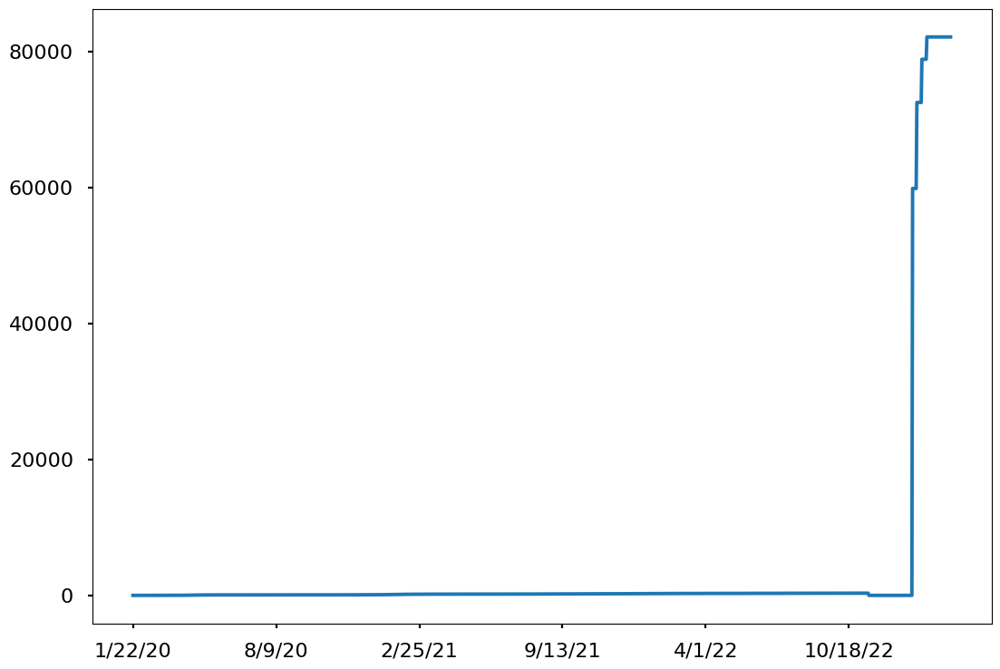

In [12]:
# @title
deaths_df.iloc[89,4:].plot()

I think  like there is a problem with the data need further investigation for now it has no explanation, maybe it is delayed report but the state is unknown so iam gonna delete this time series.

In [13]:
# @title
deaths_df.drop(deaths_df.index[89], inplace=True)
death_ts_by_country = deaths_df.drop(['Long','Lat','Province/State'],axis=1).groupby('Country/Region').sum()
global_ts_deaths = death_ts_by_country.sum()

In [14]:
# @title
print('Change Over Time')
plotly_plot(global_ts_confirmed,'line',title='Confirmed Cases Worldwide',ma=True,dir_plot=True)
plotly_plot(global_ts_deaths,'line',title='Death Cases Worldwide',ma=True,dir_plot=True)
print('Rate of Change')
plotly_plot(global_ts_confirmed,'bar',title='Rate of Confirmed Cases Worldwide',ma=True)
plotly_plot(global_ts_deaths,'bar',title='Rate of Confirmed Cases Worldwide',ma=True)

Change Over Time


Rate of Change


## Cheking Seasonality and Trend

### Confirmed Cases

In [15]:
# @title
sample_confirmed = get_rate_of_change(global_ts_confirmed).to_frame()
sample_confirmed['Date'] = sample_confirmed.index
sample_confirmed.columns=['y','ds']

c_m = Prophet(seasonality_mode='additive',changepoint_prior_scale=0.6)
c_m.fit(sample_confirmed)
future = c_m.make_future_dataframe(periods=0)
forecast = c_m.predict(future)
plot_components_plotly(c_m,forecast,figsize=(900, 400))

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm49grtf8/_fesab8m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm49grtf8/6hv4oqsg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79018', 'data', 'file=/tmp/tmpm49grtf8/_fesab8m.json', 'init=/tmp/tmpm49grtf8/6hv4oqsg.json', 'output', 'file=/tmp/tmpm49grtf8/prophet_modelk9jba9ip/prophet_model-20240729104252.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:42:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:42:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [16]:
# @title
sample_confirmed = get_rate_of_change(global_ts_deaths).to_frame()
sample_confirmed['Date'] = sample_confirmed.index
sample_confirmed.columns=['y','ds']

c_m = Prophet(seasonality_mode='additive',changepoint_prior_scale=0.5)
c_m.fit(sample_confirmed)
future = c_m.make_future_dataframe(periods=0)
forecast = c_m.predict(future)
plot_components_plotly(c_m,forecast,figsize=(900, 400))

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm49grtf8/vzfnu1u1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm49grtf8/cff7gr97.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61975', 'data', 'file=/tmp/tmpm49grtf8/vzfnu1u1.json', 'init=/tmp/tmpm49grtf8/cff7gr97.json', 'output', 'file=/tmp/tmpm49grtf8/prophet_model26twbcuf/prophet_model-20240729104255.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:42:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:42:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


# Analysis of COVID-19 Confirmed Case Trends

## 1. Initial Phase of the Pandemic
In the early stages of the pandemic, the number of confirmed cases was relatively low. This may be attributed to several factors:
- **Detection Challenges**: During this period, the methods for identifying and diagnosing COVID-19 were still being developed.
- **Data Reporting Issues**: Some countries may have been underreporting or concealing actual case numbers.
- **Virus Spread**: The virus had not yet had sufficient time to spread widely.

## 2. Seasonality Observed from 2021
Starting from early 2021, there is a noticeable seasonal pattern in the rate of confirmed cases. We observe an increase in the number of confirmed cases approximately every 3-4 months. This recurring trend suggests a cyclical pattern in the spread of the virus.

## 3. Significant Surge in Confirmed Cases
There was a marked increase in the number of confirmed cases during December 2021 and April 2022. This spike warrants further investigation to understand the underlying causes, which could include factors such as new variants, changes in public health policies, or seasonal effects.

## 4. Decrease in Seasonality Post-April 2022
After April 2022, the seasonal pattern in case rates seems to diminish. This reduction in seasonality could indicate a stabilization in the spread of the virus or a shift in the pandemic dynamics.

# COVID-19 Death Trends Analysis

## 1. Early Death Rates
- **Initial Surge**: Death rates initially spiked due to limited knowledge about the virus and its symptoms. Early on, the virus was often mistaken for a common flu, leading to delayed and inadequate responses.

## 2. Seasonality of Death Rates
- **Recurring Patterns**: Similar to confirmed case numbers, death rates also showed seasonal fluctuations approximately every 4 months. This seasonality may be linked to changes in weather patterns in certain regions and inadequate preparedness for these changes.

## 3. Trends from 2020 to 2022
- **Rising and Falling Rates**: From January 2020 to January 2021, there was a notable upward trend in death rates. This was followed by a gradual decline from January 2021 to February 2022. The decrease in death rates can be attributed to several factors:
  - **Global Awareness**: Increased global awareness about the pandemic led to better prevention strategies.
  - **Vaccination Impact**: Although vaccines were available since late 2020, the decline in death rates was initially slow due to various reasons:
    - **Slow Vaccine Rollout**:
      - **Limited Supply**: Vaccine production and distribution were initially slow.
      - **Logistical Challenges**: Setting up vaccination sites and scheduling appointments took time.
    - **Vaccine Hesitancy**:
      - **Public Concerns**: Concerns about vaccine safety and misinformation caused reluctance.
      - **Access Issues**: Vaccine access was limited in some areas.
    - **New Variants**:
      - **Increased Spread**: Variants like Delta spread rapidly, complicating control efforts.
      - **Reduced Effectiveness**: Some variants reduced vaccine effectiveness, necessitating booster shots.
    - **Delayed Benefits**:
      - **Herd Immunity**: Achieving sufficient vaccination coverage for significant impact took time.
      - **Data Lag**: Analyzing the impact of vaccines took time.
    - **Healthcare System Stress**:
      - **Overwhelmed Hospitals**: The healthcare system was strained, affecting mortality rates.

## 4. Decline in Death Rates Post-2022-2
- **Increased Vaccination Coverage**:
  - **Higher Rates**: By 2022, a larger portion of the global population was vaccinated, including booster doses, which increased immunity and reduced severe cases.
  - **Effective Vaccines**: Vaccines proved highly effective in preventing severe illness and deaths.
- **Widespread Immunity**:
  - **Herd Immunity**: Higher vaccination rates and natural immunity from previous infections contributed to reduced virus spread.
- **Improved Treatments**:
  - **Advanced Therapies**: Enhanced medical treatments improved the management of severe cases and reduced mortality.
- **Adaptation to Variants**:
  - **Updated Vaccines**: New vaccines and boosters targeted emerging variants, improving protection.
  - **Adapted Strategies**: Public health strategies were updated based on new data.
- **Public Health Measures**:
  - **Ongoing Precautions**: Continued use of masks, social distancing, and hygiene measures helped reduce transmission.
- **Behavioral Changes**:
  - **Increased Awareness**: Greater public awareness led to better adherence to preventive guidelines.


# By Country

In [17]:
# @title
sample = confirmed_ts_by_country.iloc[:,-1:].rename(columns={'3/9/23': 'total_cases'})
fig = px.treemap(sample, path=[sample.index], values='total_cases')
print('Tree Map For Number of confirmed cases By Country')
fig.show()

Tree Map For Number of confirmed cases By Country


In [18]:
# @title
sample = death_ts_by_country.iloc[:,-1:].rename(columns={'3/9/23': 'total_deaths'})

fig = px.treemap(sample, path=[sample.index], values='total_deaths')
print('Tree Map For Number of Death By Country')

fig.show()

Tree Map For Number of Death By Country


The pandemic's impact varied across countries due to several key factors, with more shared factors leading to greater effects. Some of these factors include:

- **Population Density**: Densely populated areas experienced faster virus spread.
  
- **Travel Connectivity**: High levels of international travel led to early outbreaks.

- **Healthcare Capacity**: Limited infrastructure resulted in higher mortality rates.

- **Government Response**: Timely measures controlled the spread, while delays worsened it.

- **Public Compliance**: Adherence to guidelines and vaccine acceptance influenced outcomes.

- **Socio-Economic Factors**: Economic disparities affected the ability to follow restrictions.

- **Vaccine Rollout**: The speed and efficiency of distribution impacted control efforts.

- **Emerging Variants**: New, more transmissible variants complicated containment.

- **Public Health Infrastructure**: Testing and tracing capabilities were crucial.

- **Cultural Attitudes**: Views on authority and health influenced compliance.

Here's a more detailed report on some of the top affected countries:

- **United States**:
  - High Population Density: Urban areas like New York City saw rapid transmission due to dense populations.
  - International Travel: As a major global hub, exposure to international travelers was significant.
  - Health Inequalities: Disparities in healthcare access and pre-existing conditions contributed to higher mortality rates.

- **India**:
  - Population Size: Being highly populous, controlling the virus's spread across diverse regions was challenging.
  - Healthcare System Strain: The pandemic overwhelmed infrastructure, especially during the 2021 second wave.
  - Economic Factors: Lockdowns severely impacted the economy, complicating response efforts.

- **Brazil**:
  - Government Response: Delayed and inconsistent measures led to rapid virus spread.
  - Urbanization: Cities like São Paulo and Rio de Janeiro experienced high transmission due to crowded conditions.
  - Variants: A hotspot for new variants, increasing transmission and severity.

- **Italy**:
  - Aging Population: A significant elderly population was more vulnerable to severe outcomes.
  - Initial Outbreak: As an early major outbreak outside China, the healthcare system was unprepared.
  - Healthcare System Capacity: Hospitals, especially in the north, were quickly overwhelmed.

- **United Kingdom**:
  - Population Density: High-density cities like London facilitated virus spread.
  - Initial Response: Delays in lockdowns and travel restrictions allowed wider spread.
  - Variant Emergence: Waves driven by new, more transmissible variants.

- **Mexico**:
  - Testing and Reporting: Limited testing capacity likely led to underreported cases and deaths.
  - Comorbidities: High rates of diabetes and obesity contributed to severe cases and mortality.
  - Economic Constraints: Economic pressures hindered strict lockdown maintenance.

- **Russia**:
  - Geographic Diversity: The vast and diverse regions made coordinated response efforts challenging.
  - Healthcare Infrastructure: Remote and rural areas faced shortages in facilities and resources.
  - Vaccine Rollout: Initial skepticism and logistical challenges delayed widespread uptake.

## Now I will explor data for some countries i will chose top 5 in number of death

In [19]:
# @title
top_5_by_death = list(sample.sort_values('total_deaths',ascending=False).head().index)

ts_list = []
ts_list2 = []
id_list = []
for country in top_5_by_death:
  id_list.append(f'{country} Bars')
  ts_list.append(death_ts_by_country.loc[country])
  ts_list2.append(confirmed_ts_by_country.loc[country])

print('Death')
plotly_plot(ts_list,'line',title='Death increase over time',ma=True,identifier=id_list,dir_plot=True)
plotly_plot(ts_list,'bar',title='Rate of Death',ma=True,identifier=id_list)

print('Confimed cases')
plotly_plot(ts_list2,'line',title='cases increase over time',ma=True,identifier=id_list,dir_plot=True)
plotly_plot(ts_list2,'bar',title='Rate of cases',ma=True,identifier=id_list)

Death


Confimed cases


### 1. Variation in Seasonality by Country

Each country shows different seasonality in confirmed COVID-19 cases due to:

1. **Climate and Weather**: Local conditions influence virus spread.
2. **Government Policies**: Varying effectiveness and timing of measures like lockdowns.
3. **Healthcare Capacity**: Differences in managing peak cases.
4. **Variants**: Impact of new, more transmissible strains varies.
5. **Vaccination**: Differences in rollout speed and public acceptance.

### 2. Case and Death Rate Trends (December 2021 - March 2022)

During this period, many countries saw a rise in confirmed cases but lower death rates due to:

1. **Omicron Variant**: More transmissible but generally less severe.
2. **Widespread Vaccination**: Reduced severity and prevented many severe cases.
3. **Natural Immunity**: Previous exposure led to some level of immunity, reducing severe outcomes.
4. **Improved Treatments**: Enhanced medical protocols and treatments.
5. **Public Health Measures**: Continued use of masks and social distancing helped mitigate impacts.

### 3. Seasonal Patterns: Global vs. Country-Level

Globally, confirmed cases show seasonality every 3-4 months, while country-specific data shows patterns every 10-12 months due to:

1. **Global vs. Local Variability**: Global averages smooth out local trends, showing more frequent seasonality.
2. **Diverse Climatic and Social Conditions**: Local factors create longer-term seasonal effects.
3. **Data Averaging**: Global data aggregates information, reflecting more frequent patterns.
4. **Public Health Measures**: Variations in measures impact local seasonal cycles.
5. **Vaccination and Immunity**: Global vaccination rates and immunity affect patterns differently at the country level.

### 4. Similar Patterns Post-January 2022

After January 2022, similar patterns emerged among top countries due to:

1. **Adaptation**: Adjustments to lockdowns and home-based activities influenced virus spread.
2. **Public Health Measures**: Similar global responses impacted transmission patterns.
3. **Behavioral Changes**: Common behaviors due to restrictions led to similar infection patterns.
4. **Vaccination and Immunity**: Increased global vaccination and immunity contributed to parallel trends across diverse locations.


#Investigate China Data

In [20]:
China_con = confirmed_ts_by_country.loc['China']
China_death = death_ts_by_country.loc['China']

print('Death')
plotly_plot(China_death,'line',title='Death increase over time',ma=True,dir_plot=True)
plotly_plot(China_death,'bar',title='Rate of Death',ma=True,identifier=id_list)

print('Case')
plotly_plot(China_con,'line',title='cases increase over time',ma=True,dir_plot=True)
plotly_plot(China_con,'bar',title='Rate of cases',ma=True)

Death


Case


# Analysis of China's COVID-19 Data Reporting

The data from China shows unusual patterns, with constant numbers of deaths and cases over two years, which seems improbable. After investigating, it appears that China's initial reporting policies contributed to this anomaly. Here’s a summary of the key factors:

## 1. Initial Reporting Delays
- **Early Stages**: In the early stages of the pandemic, there were delays in reporting and limited public information. This resulted in underreporting of both cases and deaths.

## 2. Information Control
- **Censorship**: The Chinese government imposed censorship and restrictions on information about the virus, including suppression of early warnings and criticism of the government's response.
- **Media Restrictions**: Journalists and independent observers faced limitations, affecting the accuracy and flow of information.

## 3. Changes in Reporting Policies
- **Increased Transparency**: As the pandemic progressed, China revised its reporting policies and increased transparency.
- **Data Revisions**: There were significant adjustments to reported figures as new information became available.

## 4. International Criticism
- **Global Scrutiny**: The international community criticized China for its initial handling of the outbreak and the impact on global transparency, focusing on the accuracy and timeliness of the reported data.


#Checking Case_Fatality_Ratio

calcualte Case_Fatality_Ratio per state

In [21]:
State_Case_Fatality_Ratio = latest_data[latest_data['Country_Region']=='US'][['Province_State','Confirmed','Deaths']].groupby('Province_State').sum()
State_Case_Fatality_Ratio['Case_Fatality_Ratio'] = (State_Case_Fatality_Ratio['Deaths']/State_Case_Fatality_Ratio['Confirmed'])*100

#let invistigate US data more in depth

In [22]:
# @title
# Select and sort data
sorted_df = State_Case_Fatality_Ratio.sort_values('Case_Fatality_Ratio', ascending=False)[1:11]

# Apply heatmap styling
styled_df = sorted_df.style.background_gradient(subset=['Case_Fatality_Ratio'], cmap='Reds')

# Display the styled DataFrame
styled_df

,Confirmed,Deaths,Case_Fatality_Ratio
Province_State,,,
Pennsylvania,3447091,49263,1.429118
Oklahoma,1261310,17502,1.387605
Georgia,3011842,41648,1.382808
Mississippi,960923,13112,1.364521
Michigan,3008317,41001,1.362922
Arizona,2391895,32503,1.358881
Nevada,880235,11823,1.343164
New Mexico,662301,8891,1.342441
Alabama,1596149,20820,1.304390


In [23]:
# @title

# Create the pie chart
fig = px.pie(
    sorted_df,
    names=sorted_df.index,
    values='Case_Fatality_Ratio',
    title='Case Fatality Ratio by Country',
    color='Case_Fatality_Ratio',
    color_discrete_sequence=px.colors.qualitative.Plotly
)

# Update layout to increase the size of the pie chart
fig.update_layout(
    width=800,  # Adjust the width as needed
    height=800  # Adjust the height as needed
)

# Show the pie chart
fig.show()

# Classification

I will do Cluster classification based on shape of time series for death change over days

Now i will scale the data because there is huge diffrance in scales

In [24]:
death_ts_by_country.shape

(201, 1143)

We have 201 time series, each with a length of T=1143. Determining the optimal number of clusters can be computationally intensive, as it requires multiple iterations over the entire dataset. To streamline this process, I will use PCA to reduce the dimensionality of the time series. This will help identify the optimal number of clusters efficiently. Once the optimal number of clusters is determined, I will perform cluster analysis on the original time series data to ensure accurate and meaningful results.

Create Dataframe for death differance for all countries

# I remved noise in two steps first using Savitzky-Golay filter and 2nd using moving average 50 after differancing

In [25]:
from scipy.signal import savgol_filter

def smooth_time_series(series, window_length=50, polyorder=2):
    """
    Smooth a time series using the Savitzky-Golay filter.

    Parameters:
        series (pd.Series): Time series data with a datetime index.
        window_length (int): The length of the filter window (must be odd and greater than polyorder).
        polyorder (int): The order of the polynomial used to fit the samples.

    Returns:
        pd.Series: Smoothed time series.
    """
    # Apply Savitzky-Golay filter
    smoothed_data = savgol_filter(series, window_length=window_length, polyorder=polyorder)

    # Return the smoothed series as a Pandas Series
    return pd.Series(smoothed_data, index=series.index)

In [26]:

def get_rate_of_change_with_ma(ts):
    """
    Calculate the rate of change of a Pandas Series.
    """
    name =ts.name
    temp_df = pd.DataFrame((get_time_series(ts)))
    temp_df.columns = ['numbers']
    temp_df['Shifted'] = temp_df['numbers'].shift(1)
    temp_df['Difference'] = temp_df['numbers'] - temp_df['Shifted']
    temp_df['Moving Average'] = temp_df['Difference'].dropna().rolling(window=50).mean().fillna(0).dropna()
    temp_df.rename(columns={'Moving Average': name}, inplace=True)
    return temp_df[name]

In [27]:
death_diff_df = pd.DataFrame()
countries = death_ts_by_country.index


for country in countries:
    series_df = get_rate_of_change_with_ma(death_ts_by_country.loc[country]).to_frame().T.fillna(0)

    death_diff_df = pd.concat([death_diff_df, series_df], axis=0)
    death_diff_df.index = death_diff_df.index[:-1].tolist() + [country]


* The StandardScaler from sklearn is used to standardize the data before applying PCA. This scaling is done to ensure that each feature (in this case, each time point across all time series) has a mean of 0 and a standard deviation of 1.

* Reason: The goal here is to prepare the data for PCA, which is sensitive to the variances of the original variables. Standardizing the data before PCA ensures that the principal components are not biased toward features with larger scales.

In [28]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
standardized_data = scaler.fit_transform(death_diff_df.T)


In [29]:
standardized_data.T.shape

(201, 1143)

In [30]:

# Apply PCA
n_components = 20
pca = PCA(n_components=n_components)
pca_transformed_data = pca.fit_transform(standardized_data.T)

Then check for the amount of variance explained by each component:

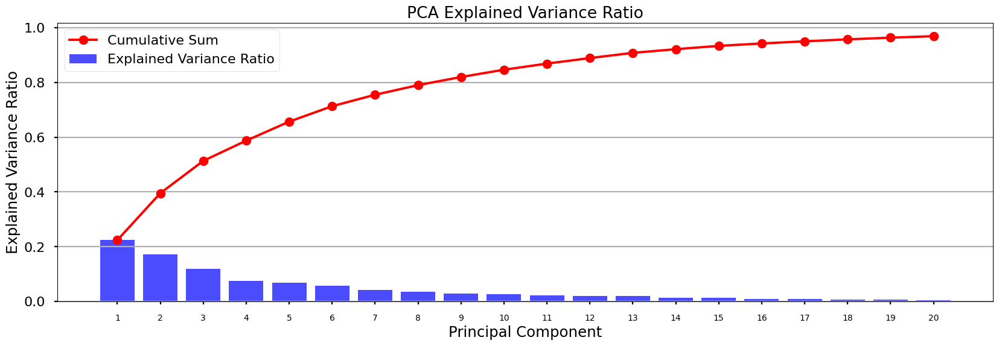

In [34]:
cumsum_explained_variance_ratio = np.cumsum(pca.explained_variance_ratio_)

# Plot the explained variance ratio and the cumulative sum line
plt.figure(figsize=(20, 6))
plt.bar(range(1, pca_transformed_data.shape[1] + 1), pca.explained_variance_ratio_, alpha=0.7, color='b', label='Explained Variance Ratio')
plt.plot(range(1, pca_transformed_data.shape[1] + 1), cumsum_explained_variance_ratio, marker='o', color='r', label='Cumulative Sum')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('PCA Explained Variance Ratio')
plt.xticks(range(1, pca_transformed_data.shape[1] + 1))
plt.grid(axis='y')
plt.xticks(fontsize=10)
plt.legend()
plt.show()

Almost 4 PCs Explain 90% of the variance but i will take 6

In [35]:
n_components = 50
pca = PCA(n_components=n_components)
pca_transformed_data = pca.fit_transform(standardized_data.T)

In [36]:
pca_transformed_data.reshape(pca_transformed_data.shape[0],pca_transformed_data.shape[1],1).shape

(201, 50, 1)

In [37]:
'''
Sum_of_squared_distances = []
silhouette_scores = []

K = range(3,20)
for k in K:

    km = TimeSeriesKMeans(n_clusters=k, metric="dtw",init="k-means++")
    km.fit(pca_transformed_data.reshape(pca_transformed_data.shape[0],pca_transformed_data.shape[1],1))
    labels = km.predict(pca_transformed_data.reshape(pca_transformed_data.shape[0],pca_transformed_data.shape[1],1))
    Sum_of_squared_distances.append(km.inertia_)
    score = silhouette_score(pca_transformed_data.reshape(pca_transformed_data.shape[0],pca_transformed_data.shape[1],1), labels)
    silhouette_scores.append(score)
    print(f'N Cluster:{k}, inertia: {km.inertia_}, silhouette_scores: {score}')
'''

'\nSum_of_squared_distances = []\nsilhouette_scores = []\n\nK = range(3,20)\nfor k in K:\n\n    km = TimeSeriesKMeans(n_clusters=k, metric="dtw",init="k-means++")\n    km.fit(pca_transformed_data.reshape(pca_transformed_data.shape[0],pca_transformed_data.shape[1],1))\n    labels = km.predict(pca_transformed_data.reshape(pca_transformed_data.shape[0],pca_transformed_data.shape[1],1))\n    Sum_of_squared_distances.append(km.inertia_)\n    score = silhouette_score(pca_transformed_data.reshape(pca_transformed_data.shape[0],pca_transformed_data.shape[1],1), labels)\n    silhouette_scores.append(score)\n    print(f\'N Cluster:{k}, inertia: {km.inertia_}, silhouette_scores: {score}\')\n'

In [38]:
from sklearn.cluster import KMeans
Sum_of_squared_distances = []
silhouette_scores = []

K = range(3,20)
for k in K:

    km = KMeans(n_clusters=k,init="k-means++")
    km.fit(pca_transformed_data)
    labels = km.predict(pca_transformed_data)
    Sum_of_squared_distances.append(km.inertia_)
    score = silhouette_score(pca_transformed_data, labels)
    silhouette_scores.append(score)
    print(f'N Cluster:{k}, inertia: {km.inertia_}, silhouette_scores: {score}')

N Cluster:3, inertia: 8119.652064792331, silhouette_scores: 0.13594783595471827
N Cluster:4, inertia: 7494.504272548588, silhouette_scores: 0.08019257865132143
N Cluster:5, inertia: 6861.6354294546745, silhouette_scores: 0.08836818465280524
N Cluster:6, inertia: 6432.77507178986, silhouette_scores: 0.09787650498657904
N Cluster:7, inertia: 6016.873864168462, silhouette_scores: 0.07972709967850605
N Cluster:8, inertia: 5897.289602325427, silhouette_scores: 0.0790671206764745
N Cluster:9, inertia: 5614.718526613133, silhouette_scores: 0.05485977631197039
N Cluster:10, inertia: 5341.218790178226, silhouette_scores: 0.0753330931792767
N Cluster:11, inertia: 5159.700620435255, silhouette_scores: 0.03619226555844037
N Cluster:12, inertia: 4926.116294958759, silhouette_scores: 0.048937743936239744
N Cluster:13, inertia: 4807.439985493421, silhouette_scores: 0.055704222879614865
N Cluster:14, inertia: 4638.97989522632, silhouette_scores: 0.050581847592569146
N Cluster:15, inertia: 4621.6455603

Using elbow method to get number of clusters

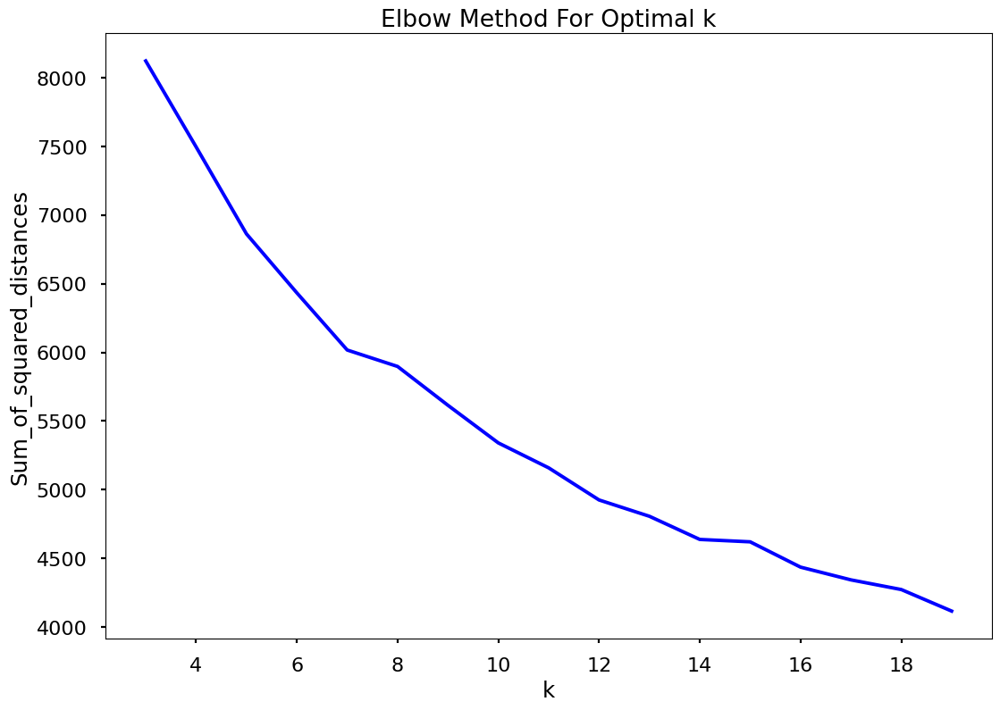

In [39]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

visualize PCs componantes just first 4

In [40]:
pca_transformed_data.shape

(201, 50)

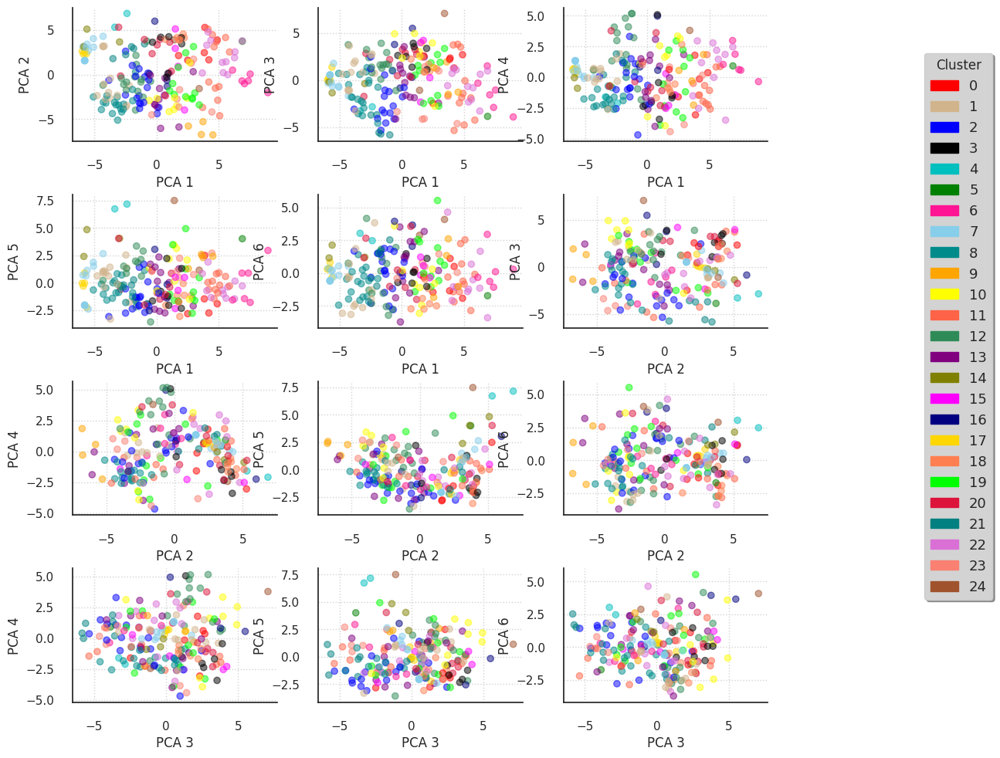

In [41]:
from sklearn.cluster import KMeans

n_clusters = 17
km = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw",init="k-means++")
km.fit(pca_transformed_data.reshape(pca_transformed_data.shape[0],pca_transformed_data.shape[1],1))
labels = km.predict(pca_transformed_data.reshape(pca_transformed_data.shape[0],pca_transformed_data.shape[1],1))
mat = pd.DataFrame(pca_transformed_data)
mat['cluster'] = pd.Series(labels)

import matplotlib.patches as mpatches

sns.set_style("white")
sns.set_context("notebook", font_scale=1, rc={"lines.linewidth": 2.5})

LABEL_COLOR_MAP = {
    0:'r',1: 'tan', 2: 'b', 3: 'k', 4: 'c', 5: 'g', 6: 'deeppink', 7: 'skyblue', 8: 'darkcyan', 9: 'orange',
    10: 'yellow', 11: 'tomato', 12: 'seagreen', 13: 'purple', 14: 'olive', 15: 'magenta', 16: 'navy',
    17: 'gold', 18: 'coral', 19: 'lime', 20: 'crimson', 21: 'teal', 22: 'orchid', 23: 'salmon',
    24: 'sienna', 25: 'peru', 26: 'lavender', 27: 'turquoise', 28: 'maroon', 29: 'chocolate', 30: 'indigo'
}
label_color = [LABEL_COLOR_MAP[l] for l in mat['cluster']]

fig = plt.figure(figsize = (12,10))
plt.subplots_adjust(left=0.1, bottom=0.05, right=0.85, top=0.95, wspace=0.2, hspace=0.4)
increment = 0
for ix in range(6):
    for iy in range(ix+1, 6):
        increment += 1
        ax = fig.add_subplot(4,3,increment)
        ax.scatter(mat[ix], mat[iy], c= label_color, alpha=0.5)
        plt.ylabel('PCA {}'.format(iy+1), fontsize = 12)
        plt.xlabel('PCA {}'.format(ix+1), fontsize = 12)
        ax.yaxis.grid(color='lightgray', linestyle=':')
        ax.xaxis.grid(color='lightgray', linestyle=':')
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)

        if increment == 12: break
    if increment == 12: break

#_______________________________________________
# I set the legend: abreviation -> airline name
comp_handler = []
for i in range(n_clusters):
    comp_handler.append(mpatches.Patch(color = LABEL_COLOR_MAP[i], label = i))

plt.legend(handles=comp_handler, bbox_to_anchor=(1.1, 0.9),
           title='Cluster', facecolor = 'lightgrey',
           shadow = True, frameon = True, framealpha = 1,
           fontsize = 13, bbox_transform = plt.gcf().transFigure)

plt.tight_layout()
plt.show()

PCA didnt help that much to know number of clusters

In [43]:
#first scale the data

#scaler_ts = TimeSeriesScalerMeanVariance()
#scaled_data = scaler_ts.fit_transform(death_diff_df)


Using MinMaxScaler instead of TimeSeriesScalerMeanVariance becuase it give better results

In [92]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(death_diff_df.T)

In [94]:
#squeezed_array = np.squeeze(scaled_data, axis=-1)

# Convert to a DataFrame
scaled_data_df = pd.DataFrame(scaled_data.T)

Using Dendrogram to know number of clusters needed

In [81]:

from tslearn.metrics import cdist_dtw
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram

data_array = scaled_data.T.copy()

distance_matrix = cdist_dtw(data_array, data_array)

linked = linkage(squareform(distance_matrix), method='ward')


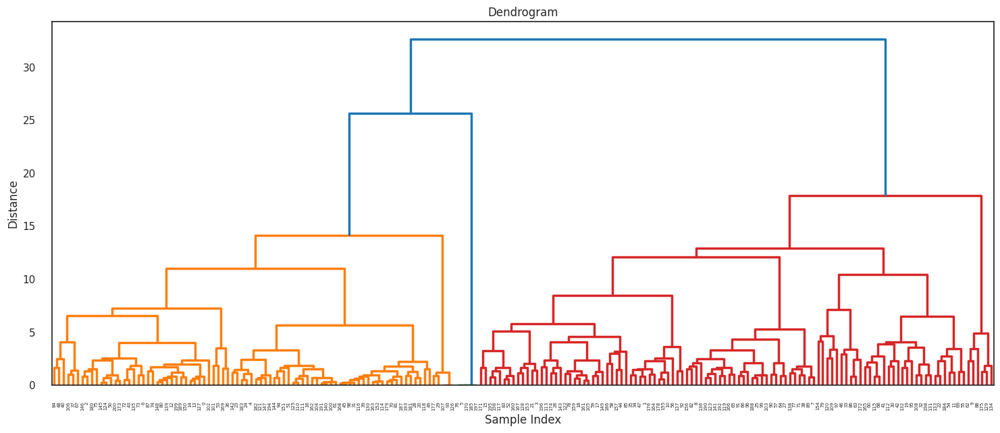

In [100]:

# Plot dendrogram
plt.figure(figsize=(18, 7))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title("Dendrogram")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()


From Dendrogram i will use 22 clusters

applying clusters using eclidean i used DTW was so bad and eclidian gave better results

In [117]:
# Clustring
kmeans_ts_final  = TimeSeriesKMeans(n_clusters=22, metric="euclidean",verbose=1,init="k-means++")
final_clusters  = kmeans_ts_final.fit_predict(scaled_data.T.reshape(201,1143,1))

29.537 --> 21.139 --> 20.353 --> 20.151 --> 20.119 --> 20.065 --> 19.994 --> 19.971 --> 19.943 --> 19.943 --> 


In [118]:
scaled_data_df.index=death_diff_df.index
scaled_data_df['cluster'] = final_clusters
clusters = scaled_data_df['cluster'].unique()


#Visualize clusters

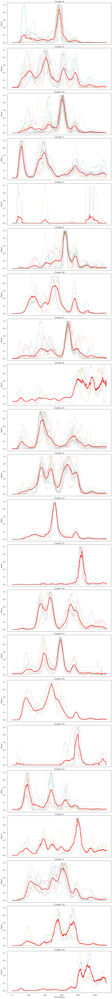

In [119]:

# Create subplots for each cluster
num_clusters = len(clusters)
fig, axes = plt.subplots(num_clusters, 1, figsize=(15, 6 * num_clusters), sharex=True)

# Iterate over clusters and plot each one
for i, cluster in enumerate(clusters):
    ax = axes[i] if num_clusters > 1 else axes
    cluster_data = scaled_data_df[scaled_data_df['cluster'] == cluster]
    ax.plot(kmeans_ts_final.cluster_centers_[cluster].ravel(), "r-",  linewidth=4)
    for index, row in cluster_data.iterrows():
        time_series = row[:-1]

        ax.plot(time_series, label=f'Row {index}',alpha=.3,linewidth=2)

    ax.set_title(f'Cluster {cluster}')
    ax.set_ylabel('Value')
    #ax.legend(title='Rows')

# Add x-axis label to the bottom subplot
axes[-1].set_xlabel('Time Points')

plt.tight_layout()
plt.show()

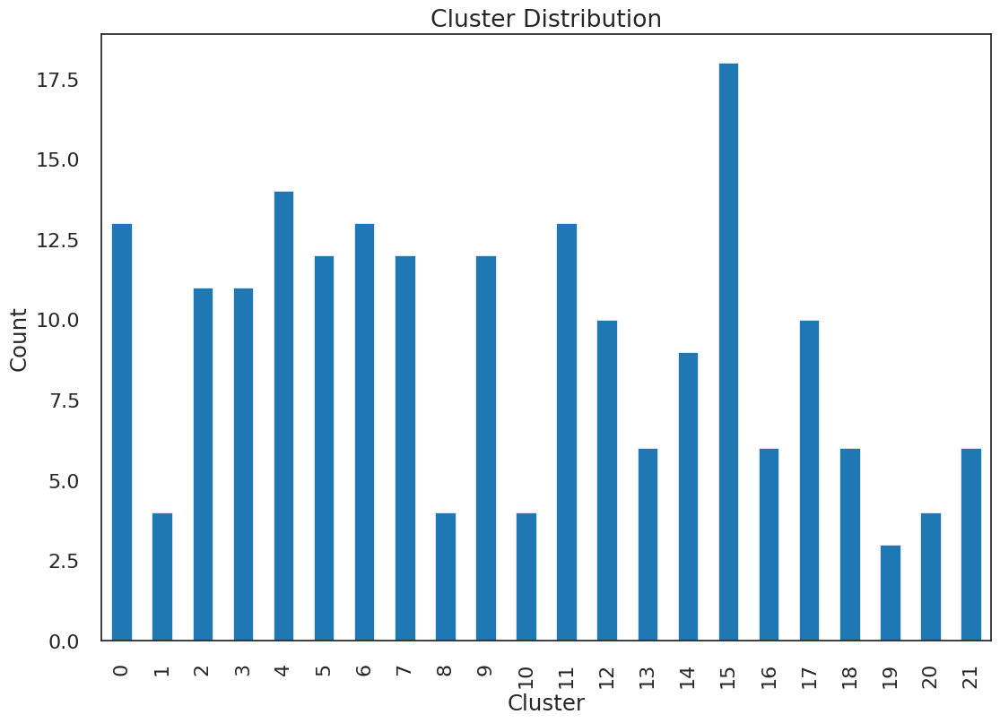

In [120]:
scaled_data_df['cluster'].value_counts().sort_index().plot(kind='bar')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Cluster Distribution')
plt.show()

Visualize clusters on the world map

In [121]:
scaled_data_df['categ'] = scaled_data_df['cluster'].astype(str)
scaled_data_df.sort_values('cluster',inplace=True)
fig = px.choropleth(
    scaled_data_df.reset_index(),
    locations='index',
    locationmode='country names',
    color='categ',
    hover_name='index',
    title='Choropleth Map of Clusters by Country',
    color_discrete_sequence=px.colors.qualitative.Set3  # Use a discrete color set
)

fig.update_geos(projection_type="natural earth")
fig.update_layout(
    geo=dict(showframe=False, showcoastlines=False),
    width=1200,
    height=800
)
fig.show()